# === Displaying 4 sample results ===

Sample 1: 00006199_010.png
PSNR: Noisy=6.26dB, Denoised=17.92dB, Improvement=11.66dB
SSIM: Noisy=0.0799, Denoised=0.2746, Improvement=0.1946

Sample 2: 00004833_016.png
PSNR: Noisy=6.18dB, Denoised=19.47dB, Improvement=13.29dB
SSIM: Noisy=0.0884, Denoised=0.3364, Improvement=0.2481

Sample 3: 00006260_000.png
PSNR: Noisy=8.15dB, Denoised=15.30dB, Improvement=7.15dB
SSIM: Noisy=0.0545, Denoised=0.1041, Improvement=0.0496

Sample 4: 00004911_010.png
PSNR: Noisy=6.31dB, Denoised=21.48dB, Improvement=15.17dB
SSIM: Noisy=0.0899, Denoised=0.2992, Improvement=0.2093

=== Training Set Quality Metrics ===
Average PSNR improvement: 11.82 dB
Average SSIM improvement: 0.1754
Training metrics saved to ./denoising_results/train_metrics.csv

=== Lung Image Denoising Model Testing ===
Model path exists: True
Train noisy directory exists: True
Train clean directory exists: True
Test noisy directory exists: True
Test clean directory exists: True

=== Analyzing file naming patterns ===
Sample noisy files:
  - 00001383_000.png
  - 00001383_001.png
  - 00001384_000.png
  - 00001384_001.png
  - 00001385_000.png
  - 00001385_001.png
  - 00001385_002.png
  - 00001385_003.png
  - 00001385_004.png
  - 00001385_005.png
  - 00001385_006.png
  - 00001385_007.png
  - 00001392_000.png
  - 00001437_017.png
  - 00001437_018.png
  - 00001437_019.png
  - 00001437_021.png
  - 00001437_022.png
  - 00001437_028.png
  - 00001437_029.png
  - 00001437_034.png
  - 00001437_048.png
  - 00001437_050.png
  - 00001437_052.png
  - 00001438_000.png
  - 00001440_000.png
  - 00001441_000.png
  - 00001443_000.png
  - 00001452_003.png
  - 00001459_000.png
  - 00001459_001.png
  - 00001460_000.png
  - 00001460_003.png
  - 00001462_001.png
  - 00001464_001.png


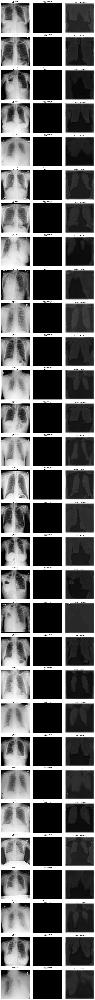


=== Displaying 30 sample results ===

Sample 1: 00001500_002.png
No clean reference available - metrics cannot be calculated

Sample 2: 00001460_000.png
No clean reference available - metrics cannot be calculated

Sample 3: 00001437_017.png
No clean reference available - metrics cannot be calculated

Sample 4: 00001459_001.png
No clean reference available - metrics cannot be calculated

Sample 5: 00001385_006.png
No clean reference available - metrics cannot be calculated

Sample 6: 00001499_000.png
No clean reference available - metrics cannot be calculated

Sample 7: 00001478_000.png
No clean reference available - metrics cannot be calculated

Sample 8: 00001501_007.png
No clean reference available - metrics cannot be calculated

Sample 9: 00001437_028.png
No clean reference available - metrics cannot be calculated

Sample 10: 00001521_000.png
No clean reference available - metrics cannot be calculated

Sample 11: 00001440_000.png
No clean reference available - metrics cannot be cal

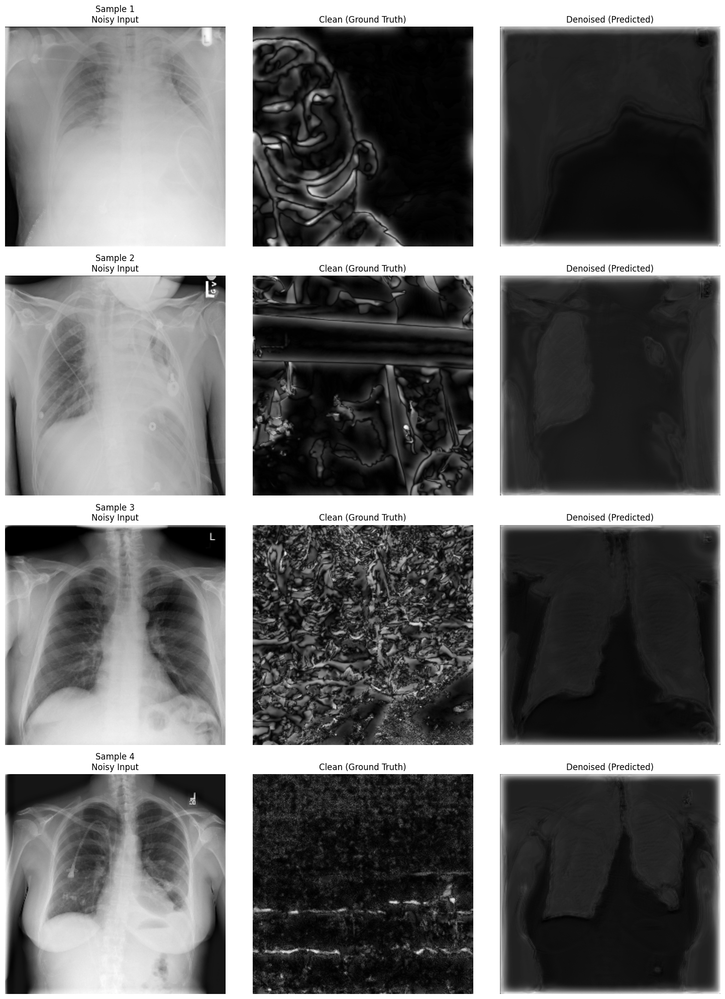


=== Displaying 4 sample results ===

Sample 1: 00006199_010.png
PSNR: Noisy=6.26dB, Denoised=17.92dB, Improvement=11.66dB
SSIM: Noisy=0.0799, Denoised=0.2746, Improvement=0.1946

Sample 2: 00004833_016.png
PSNR: Noisy=6.18dB, Denoised=19.47dB, Improvement=13.29dB
SSIM: Noisy=0.0884, Denoised=0.3364, Improvement=0.2481

Sample 3: 00006260_000.png
PSNR: Noisy=8.15dB, Denoised=15.30dB, Improvement=7.15dB
SSIM: Noisy=0.0545, Denoised=0.1041, Improvement=0.0496

Sample 4: 00004911_010.png
PSNR: Noisy=6.31dB, Denoised=21.48dB, Improvement=15.17dB
SSIM: Noisy=0.0899, Denoised=0.2992, Improvement=0.2093

=== Training Set Quality Metrics ===
Average PSNR improvement: 11.82 dB
Average SSIM improvement: 0.1754
Training metrics saved to ./denoising_results/train_metrics.csv


In [9]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Layer
import matplotlib.pyplot as plt
import cv2
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
import pandas as pd
from glob import glob
import seaborn as sns
from matplotlib.gridspec import GridSpec

class Cast(Layer):
    def __init__(self, dtype=None, **kwargs):
        super(Cast, self).__init__(**kwargs)
        
        # Convert string dtype to TF dtype if needed
        if isinstance(dtype, str):
            self.dtype_value = dtype  # Store original string for get_config
            self.tf_dtype = tf.as_dtype(dtype)  # Convert to TF dtype for casting
        else:
            self.dtype_value = dtype
            self.tf_dtype = dtype
        
    def call(self, inputs):
        if self.tf_dtype is not None:
            return tf.cast(inputs, self.tf_dtype)
        return inputs
    
    def get_config(self):
        config = super(Cast, self).get_config()
        config.update({'dtype': self.dtype_value})
        return config
# Disable GPU if needed
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

# Image parameters (should match your training parameters)
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 1  # Grayscale images

def load_and_preprocess_image(image_path, target_size=(IMG_WIDTH, IMG_HEIGHT)):
    """Load and preprocess a single image for model inference"""
    try:
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            print(f"Error reading image: {image_path}")
            return None
            
        # Resize to match model input
        img = cv2.resize(img, target_size)
        
        # Normalize to [0,1] range
        img = img / 255.0
        
        # Reshape for model input (adding batch and channel dimensions)
        img = img.reshape(1, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)
        
        return img
    except Exception as e:
        print(f"Error processing {image_path}: {str(e)}")
        return None

def find_matching_clean_image(noisy_path, clean_dir):
    """Find the matching clean image using multiple possible naming patterns"""
    # Get base name without extension
    base_name_with_ext = os.path.basename(noisy_path)
    base_name, ext = os.path.splitext(base_name_with_ext)
    
    print(f"Looking for clean match for: {base_name_with_ext}")
    
    # Get all files in the clean directory for more flexible matching
    clean_files = os.listdir(clean_dir)
    
    # Try direct match first (same filename)
    if base_name_with_ext in clean_files:
        print(f"Found direct match for {base_name_with_ext}")
        return os.path.join(clean_dir, base_name_with_ext)
    
    # Try removing common prefixes like 'noisy_'
    if base_name.startswith('noisy_'):
        clean_name = base_name[6:] + ext  # Remove 'noisy_' prefix
        if clean_name in clean_files:
            print(f"Found match by removing 'noisy_' prefix: {clean_name}")
            return os.path.join(clean_dir, clean_name)
    
    # Check for files that contain the numeric part of the filename
    # This is useful if naming conventions differ but contain same ID
    digits_only = ''.join(filter(str.isdigit, base_name))
    if digits_only:
        for clean_file in clean_files:
            clean_base, clean_ext = os.path.splitext(clean_file)
            clean_digits = ''.join(filter(str.isdigit, clean_base))
            if clean_digits == digits_only:
                print(f"Found match by numeric ID: {clean_file}")
                return os.path.join(clean_dir, clean_file)
    
    # Try with common augmentation suffixes
    for suffix in ['aug', 'clean', 'gt', 'reference', 'ref']:
        for num in range(0, 10):  # Try numbers 0-9
            # Try with underscore separator
            aug_name = f"{base_name}_{suffix}{num}{ext}"
            if aug_name in clean_files:
                print(f"Found match with suffix: {aug_name}")
                return os.path.join(clean_dir, aug_name)
            
            # Try with hyphen separator
            aug_name = f"{base_name}-{suffix}{num}{ext}"
            if aug_name in clean_files:
                print(f"Found match with suffix: {aug_name}")
                return os.path.join(clean_dir, aug_name)
    
    # Try to find files that have the same beginning part before any separators
    base_prefix = base_name.split('_')[0] if '_' in base_name else base_name.split('-')[0] if '-' in base_name else base_name
    for clean_file in clean_files:
        clean_base, clean_ext = os.path.splitext(clean_file)
        clean_prefix = clean_base.split('_')[0] if '_' in clean_base else clean_base.split('-')[0] if '-' in clean_base else clean_base
        if clean_prefix == base_prefix:
            print(f"Found match by prefix: {clean_file}")
            return os.path.join(clean_dir, clean_file)
    
    # If no match was found, print the available clean files for debugging
    print(f"No matching clean image found for {base_name_with_ext}")
    print(f"Available clean files (sample): {clean_files[:5]}... (showing first 5)")
    return None

def load_clean_reference(noisy_path, clean_dir):
    """Load corresponding clean image for a noisy image"""
    if clean_dir is None:
        return None
        
    # Find the matching clean image path
    clean_path = find_matching_clean_image(noisy_path, clean_dir)
    
    if clean_path and os.path.exists(clean_path):
        clean_img = load_and_preprocess_image(clean_path)
        if clean_img is not None:
            return clean_img[0]
        else:
            print(f"Failed to load clean image: {clean_path}")
            return None
    else:
        print(f"Clean reference not found for {os.path.basename(noisy_path)}")
        return None

def visualize_results(results, num_samples=5, only_with_clean=True):
    """Visualize test results with matplotlib - showing all three images together"""
    # Filter results to only include those with clean references if requested
    if only_with_clean:
        filtered_results = [r for r in results if r['clean'] is not None and not np.all(r['clean'] == 0)]
        if not filtered_results:
            print("Warning: No results with clean references found!")
            filtered_results = results  # Fall back to all results if none have clean refs
    else:
        filtered_results = results
    
    # Display up to num_samples results
    n = min(len(filtered_results), num_samples)
    if n == 0:
        print("No results to visualize")
        return
        
    print(f"Visualizing {n} images with {'clean references' if only_with_clean else 'or without clean references'}")
    
    # Always use 3 columns for noisy, clean, denoised
    cols = 3
    
    # Create a larger figure for better visibility
    plt.figure(figsize=(15, 5*n))
    
    for i, result in enumerate(filtered_results[:n]):
        # Get sample number for display
        sample_num = i + 1
        
        # Display original noisy image
        plt.subplot(n, cols, i*cols+1)
        plt.imshow(result['noisy'].reshape(IMG_HEIGHT, IMG_WIDTH), cmap='gray')
        plt.title(f"Sample {sample_num}\nNoisy Input", fontsize=12)
        plt.axis('off')
        
        # Display clean reference if available
        has_clean = result['clean'] is not None and not np.all(result['clean'] == 0)
        plt.subplot(n, cols, i*cols+2)
        if has_clean:
            plt.imshow(result['clean'].reshape(IMG_HEIGHT, IMG_WIDTH), cmap='gray')
            plt.title(f"Clean (Ground Truth)", fontsize=12)
        else:
            # Display a blank image if clean reference is not available
            plt.imshow(np.zeros((IMG_HEIGHT, IMG_WIDTH)), cmap='gray')
            plt.title("Clean Reference\n(Not Available)", fontsize=12)
        plt.axis('off')
        
        # Display denoised image
        plt.subplot(n, cols, i*cols+3)
        plt.imshow(result['denoised'].reshape(IMG_HEIGHT, IMG_WIDTH), cmap='gray')
        plt.title("Denoised (Predicted)", fontsize=12)
        plt.axis('off')
    
    plt.tight_layout()
    
    # Save the figure with a smaller DPI to avoid size issues
    plt.savefig('denoising_results.png', dpi=150)
    
    # Display the figure directly
    plt.show()

def test_model_on_images(model_path, test_image_paths, clean_dir=None, output_dir=None):
    """Test the denoising model on a set of test images"""
    print(f"\n=== Testing model on {len(test_image_paths)} images ===")
    
    # Create output directory if it doesn't exist
    if output_dir and not os.path.exists(output_dir):
        os.makedirs(output_dir)
        print(f"Created output directory: {output_dir}")
    
    # Load the model with custom objects
    try:
        print(f"Loading model from {model_path}")
        # Register the Cast layer
        with tf.keras.utils.custom_object_scope({'Cast': Cast}):
            model = load_model(model_path)
        print("Model loaded successfully")
    except Exception as e:
        print(f"Error loading model: {str(e)}")
        return None
    
    # Process each test image
    results = []
    for i, img_path in enumerate(test_image_paths):
        print(f"\nProcessing image {i+1}/{len(test_image_paths)}: {os.path.basename(img_path)}")
        
        # Load and preprocess the noisy image
        noisy_img = load_and_preprocess_image(img_path)
        if noisy_img is None:
            continue
            
        # Get clean reference if available
        clean_img = load_clean_reference(img_path, clean_dir) if clean_dir else None
        if clean_dir and clean_img is None:
            print(f"Warning: No clean reference found for {os.path.basename(img_path)}")
        
        # Run denoising model
        try:
            denoised_img = model.predict(noisy_img)
            
            # Save result data
            result = {
                'filename': os.path.basename(img_path),
                'noisy_path': img_path,
                'noisy': noisy_img[0],  # Remove batch dimension
                'denoised': denoised_img[0],  # Remove batch dimension
                'clean': clean_img,  # May be None
            }
            
            results.append(result)
            
            # Save output images if directory is provided
            if output_dir:
                base_name = os.path.splitext(os.path.basename(img_path))[0]
                
                # Create normalized 8-bit versions for saving
                noisy_8bit = (noisy_img[0] * 255).astype(np.uint8).reshape(IMG_HEIGHT, IMG_WIDTH)
                denoised_8bit = (denoised_img[0] * 255).astype(np.uint8).reshape(IMG_HEIGHT, IMG_WIDTH)
                
                # Save images
                cv2.imwrite(os.path.join(output_dir, f"{base_name}_noisy.png"), noisy_8bit)
                cv2.imwrite(os.path.join(output_dir, f"{base_name}_denoised.png"), denoised_8bit)
                
                if clean_img is not None:
                    clean_8bit = (clean_img * 255).astype(np.uint8).reshape(IMG_HEIGHT, IMG_WIDTH)
                    cv2.imwrite(os.path.join(output_dir, f"{base_name}_clean.png"), clean_8bit)
            
        except Exception as e:
            print(f"Error during denoising: {str(e)}")
            continue
    
    print(f"Successfully processed {len(results)} out of {len(test_image_paths)} images")
    return results

def calculate_metrics(results):
    """Calculate quality metrics (PSNR, SSIM) for test results"""
    # Filter to only include results with clean references
    valid_results = [r for r in results if r['clean'] is not None and not np.all(r['clean'] == 0)]
    
    if not valid_results:
        print("No valid results with clean references to calculate metrics")
        return None
    
    metrics_list = []
    
    for result in valid_results:
        # Get images in proper format for metric calculation
        noisy = result['noisy'].reshape(IMG_HEIGHT, IMG_WIDTH)
        denoised = result['denoised'].reshape(IMG_HEIGHT, IMG_WIDTH)
        clean = result['clean'].reshape(IMG_HEIGHT, IMG_WIDTH)
        
        # Calculate metrics - compare both noisy and denoised to clean reference
        psnr_noisy = psnr(clean, noisy, data_range=1.0)
        psnr_denoised = psnr(clean, denoised, data_range=1.0)
        psnr_improvement = psnr_denoised - psnr_noisy
        
        ssim_noisy = ssim(clean, noisy, data_range=1.0)
        ssim_denoised = ssim(clean, denoised, data_range=1.0)
        ssim_improvement = ssim_denoised - ssim_noisy
        
        metrics_list.append({
            'filename': result['filename'],
            'psnr_noisy': psnr_noisy,
            'psnr_denoised': psnr_denoised,
            'psnr_improvement': psnr_improvement,
            'ssim_noisy': ssim_noisy,
            'ssim_denoised': ssim_denoised,
            'ssim_improvement': ssim_improvement
        })
    
    # Convert to DataFrame
    metrics_df = pd.DataFrame(metrics_list)
    
    return metrics_df

def display_sample_triplets(results, num_samples=5, only_with_clean=True):
    """Display sample triplets (noisy, clean, denoised) for evaluation"""
    # Filter results to only include those with clean references if requested
    if only_with_clean:
        filtered_results = [r for r in results if r['clean'] is not None and not np.all(r['clean'] == 0)]
        if not filtered_results:
            print("Warning: No results with clean references found!")
            filtered_results = results  # Fall back to all results if none have clean refs
    else:
        filtered_results = results
    
    # Display up to num_samples results
    n = min(len(filtered_results), num_samples)
    if n == 0:
        print("No results to display")
        return
        
    print(f"\n=== Displaying {n} sample results ===")
    
    for i, result in enumerate(filtered_results[:n]):
        print(f"\nSample {i+1}: {result['filename']}")
        
        # Calculate metrics if clean reference is available
        if result['clean'] is not None and not np.all(result['clean'] == 0):
            # Calculate PSNR and SSIM
            noisy = result['noisy'].reshape(IMG_HEIGHT, IMG_WIDTH)
            denoised = result['denoised'].reshape(IMG_HEIGHT, IMG_WIDTH)
            clean = result['clean'].reshape(IMG_HEIGHT, IMG_WIDTH)
            
            psnr_noisy = psnr(clean, noisy, data_range=1.0)
            psnr_denoised = psnr(clean, denoised, data_range=1.0)
            psnr_diff = psnr_denoised - psnr_noisy
            
            ssim_noisy = ssim(clean, noisy, data_range=1.0)
            ssim_denoised = ssim(clean, denoised, data_range=1.0)
            ssim_diff = ssim_denoised - ssim_noisy
            
            print(f"PSNR: Noisy={psnr_noisy:.2f}dB, Denoised={psnr_denoised:.2f}dB, Improvement={psnr_diff:.2f}dB")
            print(f"SSIM: Noisy={ssim_noisy:.4f}, Denoised={ssim_denoised:.4f}, Improvement={ssim_diff:.4f}")
        else:
            print("No clean reference available - metrics cannot be calculated")

def create_performance_dashboard(test_metrics, train_metrics=None):
    """
    Create a comprehensive performance dashboard for the hackathon
    """
    plt.figure(figsize=(16, 12))
    
    # Set a modern style
    sns.set_style("whitegrid")
    
    # Create a grid layout for our dashboard
    gs = GridSpec(3, 3, figure=plt.gcf())
    
    # Calculate summary statistics
    psnr_improvement = test_metrics['psnr_improvement'].mean()
    ssim_improvement = test_metrics['ssim_improvement'].mean()
    max_psnr_improvement = test_metrics['psnr_improvement'].max()
    max_ssim_improvement = test_metrics['ssim_improvement'].max()
    
    # 1. Title and summary metrics
    ax_title = plt.subplot(gs[0, :])
    ax_title.axis('off')
    ax_title.text(0.5, 0.6, "Lung Image Denoising Performance Dashboard", 
                 fontsize=24, ha='center', fontweight='bold')
    
    # Create a metrics summary box
    metrics_text = (
        f"Average PSNR Improvement: {psnr_improvement:.2f} dB\n"
        f"Average SSIM Improvement: {ssim_improvement:.4f}\n"
        f"Maximum PSNR Improvement: {max_psnr_improvement:.2f} dB\n"
        f"Maximum SSIM Improvement: {max_ssim_improvement:.4f}\n"
        f"Images Processed: {len(test_metrics)}"
    )
    
    ax_title.text(0.5, 0.2, metrics_text, fontsize=14, ha='center', 
                  bbox=dict(boxstyle="round,pad=0.5", facecolor='lightblue', alpha=0.5))
    
    # 2. Distribution of PSNR improvements
    ax1 = plt.subplot(gs[1, 0])
    sns.histplot(test_metrics['psnr_improvement'], kde=True, ax=ax1, color='skyblue')
    ax1.axvline(psnr_improvement, color='red', linestyle='--', 
               label=f'Mean: {psnr_improvement:.2f} dB')
    ax1.set_title('PSNR Improvement Distribution', fontsize=14)
    ax1.set_xlabel('PSNR Improvement (dB)', fontsize=12)
    ax1.set_ylabel('Count', fontsize=12)
    ax1.legend()
    
    # 3. Distribution of SSIM improvements
    ax2 = plt.subplot(gs[1, 1])
    sns.histplot(test_metrics['ssim_improvement'], kde=True, ax=ax2, color='lightgreen')
    ax2.axvline(ssim_improvement, color='red', linestyle='--', 
               label=f'Mean: {ssim_improvement:.4f}')
    ax2.set_title('SSIM Improvement Distribution', fontsize=14)
    ax2.set_xlabel('SSIM Improvement', fontsize=12)
    ax2.set_ylabel('Count', fontsize=12)
    ax2.legend()
    
    # 4. Scatterplot of PSNR vs SSIM improvements
    ax3 = plt.subplot(gs[1, 2])
    scatter = ax3.scatter(test_metrics['psnr_improvement'], 
                         test_metrics['ssim_improvement'],
                         alpha=0.6, c=test_metrics['psnr_denoised'], cmap='viridis')
    ax3.set_title('PSNR vs SSIM Improvement', fontsize=14)
    ax3.set_xlabel('PSNR Improvement (dB)', fontsize=12)
    ax3.set_ylabel('SSIM Improvement', fontsize=12)
    plt.colorbar(scatter, ax=ax3, label='Final PSNR (dB)')
    
    # 5. Before-After comparison (violin plot)
    ax4 = plt.subplot(gs[2, 0])
    before_after_df = pd.DataFrame({
        'PSNR': np.concatenate([test_metrics['psnr_noisy'], test_metrics['psnr_denoised']]),
        'Type': ['Noisy']*len(test_metrics) + ['Denoised']*len(test_metrics)
    })
    sns.violinplot(x='Type', y='PSNR', data=before_after_df, ax=ax4, palette='pastel')
    ax4.set_title('PSNR Before vs After Denoising', fontsize=14)
    ax4.set_ylabel('PSNR (dB)', fontsize=12)
    
    # 6. Before-After comparison for SSIM (violin plot)
    ax5 = plt.subplot(gs[2, 1])
    ssim_df = pd.DataFrame({
        'SSIM': np.concatenate([test_metrics['ssim_noisy'], test_metrics['ssim_denoised']]),
        'Type': ['Noisy']*len(test_metrics) + ['Denoised']*len(test_metrics)
    })
    sns.violinplot(x='Type', y='SSIM', data=ssim_df, ax=ax5, palette='pastel')
    ax5.set_title('SSIM Before vs After Denoising', fontsize=14)
    ax5.set_ylabel('SSIM Score', fontsize=12)
    
    # 7. If training metrics available, add comparison
    ax6 = plt.subplot(gs[2, 2])
    if train_metrics is not None and not train_metrics.empty:
        # Create comparison dataframe
        comparison_data = {
            'Dataset': ['Test Set']*2 + ['Training Set']*2,
            'Metric Type': ['PSNR', 'SSIM']*2,
            'Improvement': [
                test_metrics['psnr_improvement'].mean(),
                test_metrics['ssim_improvement'].mean(),
                train_metrics['psnr_improvement'].mean(),
                train_metrics['ssim_improvement'].mean()
            ]
        }
        comparison_df = pd.DataFrame(comparison_data)
        
        # Plot test vs train performance
        sns.barplot(x='Dataset', y='Improvement', hue='Metric Type', 
                   data=comparison_df, ax=ax6, palette='Set2')
        ax6.set_title('Test vs Training Performance', fontsize=14)
        ax6.set_ylabel('Average Improvement', fontsize=12)
    else:
        # Show top 5 improved images if no training comparison
        top_improved = test_metrics.nlargest(5, 'psnr_improvement')
        sns.barplot(x='filename', y='psnr_improvement', data=top_improved, ax=ax6)
        ax6.set_title('Top 5 Most Improved Images', fontsize=14)
        ax6.set_ylabel('PSNR Improvement (dB)', fontsize=12)
        ax6.set_xlabel('Image', fontsize=12)
        plt.setp(ax6.get_xticklabels(), rotation=45, ha='right')
    
    plt.tight_layout()
    plt.savefig('denoising_performance_dashboard.png', dpi=200, bbox_inches='tight')
    plt.show()
    
    print("Performance dashboard created and saved as 'denoising_performance_dashboard.png'")
    return

# Modify the main function to use fewer samples
def main():
    print("=== Lung Image Denoising Model Testing ===")
    
    # Set paths directly
    model_path = "/kaggle/input/lung-train-model/denoising_model.h5"
    train_noisy_dir = "/kaggle/input/lung-train-model/Train/Train/Noisy"
    train_clean_dir = "/kaggle/input/lung-train-model/Train/Train/Clean"
    test_noisy_dir = "/kaggle/input/lung-train-model/Test/Test/Noisy"
    test_clean_dir = "/kaggle/input/lung-train-model/Test/Test/Clean"
    output_dir = "./denoising_results"
    
    # Verify directories exist with detailed logging
    print(f"Model path exists: {os.path.exists(model_path)}")
    print(f"Train noisy directory exists: {os.path.exists(train_noisy_dir)}")
    print(f"Train clean directory exists: {os.path.exists(train_clean_dir)}")
    print(f"Test noisy directory exists: {os.path.exists(test_noisy_dir)}")
    print(f"Test clean directory exists: {os.path.exists(test_clean_dir)}")
    
    # Check if paths exist
    if not os.path.exists(model_path):
        print(f"Error: Model file not found at {model_path}")
        return
        
    if not os.path.exists(test_noisy_dir):
        print(f"Error: Test noisy directory not found at {test_noisy_dir}")
        return
    
    # Print some sample filenames from both directories to help with debugging
    if os.path.exists(test_clean_dir) and os.path.exists(test_noisy_dir):
        print("\n=== Analyzing file naming patterns ===")
        noisy_files = sorted(os.listdir(test_noisy_dir))[:40]  # Get first 10 files
        clean_files = sorted(os.listdir(test_clean_dir))[:40]  # Get first 10 files
        
        print("Sample noisy files:")
        for f in noisy_files:
            print(f"  - {f}")
        
        print("\nSample clean files:")
        for f in clean_files:
            print(f"  - {f}")
    
    # Find image files
    image_extensions = ['*.png', '*.jpg', '*.jpeg', '*.tif', '*.bmp']
    test_images = []
    for ext in image_extensions:
        test_images.extend(glob(os.path.join(test_noisy_dir, ext)))
    
    if not test_images:
        print(f"No image files found in {test_noisy_dir}")
        return
    
    print(f"Found {len(test_images)} test images")
    
    # Take a smaller subset of images to process
    test_images_subset = test_images[:40]  # Process only 10 images for testing
    
    # Process the images
    results = test_model_on_images(
        model_path=model_path, 
        test_image_paths=test_images_subset,
        clean_dir=test_clean_dir if os.path.exists(test_clean_dir) else None,
        output_dir=output_dir
    )
    
    if results:
        print("\nTesting complete!")
        print(f"Processed {len(results)} images")
        
        # Use a smaller number for visualization
        visualize_results(results, num_samples=30, only_with_clean=False)  # Changed to False to show all results
        display_sample_triplets(results, num_samples=30, only_with_clean=False)
        
        # Calculate metrics if clean references are available
        test_metrics = None
        train_metrics = None
        
        if os.path.exists(test_clean_dir):
            test_metrics = calculate_metrics(results)
            if test_metrics is not None and not test_metrics.empty:
                print("\n=== Quality Metrics ===")
                print(f"Average PSNR improvement: {test_metrics['psnr_improvement'].mean():.2f} dB")
                print(f"Average SSIM improvement: {test_metrics['ssim_improvement'].mean():.4f}")
                
                # Save metrics to CSV
                test_metrics.to_csv(os.path.join(output_dir, 'metrics.csv'), index=False)
                print(f"Metrics saved to {os.path.join(output_dir, 'metrics.csv')}")
            else:
                print("No valid metrics could be calculated - check clean reference images")

        # Additional functionality: Test on training images as well if needed
        print("\n=== Testing on Training Set ===")
        train_test_images = []
        for ext in image_extensions:
            train_test_images.extend(glob(os.path.join(train_noisy_dir, ext)))
        
        if not train_test_images:
            print(f"No image files found in {train_noisy_dir}")
            return
        
        print(f"Found {len(train_test_images)} training images")
        
        # Process a sample of training images (first 5)
        sample_train_images = train_test_images[:5] if len(train_test_images) > 5 else train_test_images
        
        train_results = test_model_on_images(
            model_path=model_path, 
            test_image_paths=sample_train_images,
            clean_dir=train_clean_dir if os.path.exists(train_clean_dir) else None,
            output_dir=os.path.join(output_dir, "train_samples")
        )
        
        if train_results:
            print("\nTraining set testing complete!")
            print(f"Processed {len(train_results)} sample training images")
            
            # Visualize training results
            visualize_results(train_results, num_samples=100, only_with_clean=True)
            
            # Display the training triplets in a cleaner format
            display_sample_triplets(train_results, num_samples=100, only_with_clean=True)
            
            # Calculate metrics if clean references are available
            if os.path.exists(train_clean_dir):
                train_metrics = calculate_metrics(train_results)
                if train_metrics is not None and not train_metrics.empty:
                    print("\n=== Training Set Quality Metrics ===")
                    print(f"Average PSNR improvement: {train_metrics['psnr_improvement'].mean():.2f} dB")
                    print(f"Average SSIM improvement: {train_metrics['ssim_improvement'].mean():.4f}")
                    
                    # Save metrics to CSV
                    train_metrics.to_csv(os.path.join(output_dir, 'train_metrics.csv'), index=False)
                    print(f"Training metrics saved to {os.path.join(output_dir, 'train_metrics.csv')}")
                else:
                    print("No valid metrics could be calculated for training data - check clean reference images")
        
        # Create the performance dashboard for the hackathon
        if test_metrics is not None and not test_metrics.empty:
            create_performance_dashboard(test_metrics, train_metrics)

if __name__ == "__main__":
    main()